In [52]:
import PIL.Image as Image
import numpy as np
from matplotlib import pyplot as plt
import os
import glob

In [4]:
image = Image.open('training/CAT_00_00000364_025.jpg')
type(image)

PIL.JpegImagePlugin.JpegImageFile

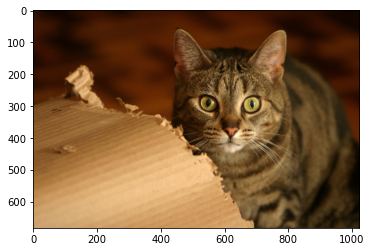

In [15]:
plt.imshow(np.array(image,dtype=np.uint8))

In [22]:
with open('training/CAT_00_00000364_025.jpg.cat') as fid:
    tmp = [np.float32(x) for x in fid.readline().split()]
tmp = np.array(tmp)[1:].reshape((5,2))

In [23]:
tmp

array([[548., 290.],
       [687., 295.],
       [618., 397.],
       [455.,  62.],
       [782.,  65.]], dtype=float32)

In [ ]:
center = np.mean(tmp,axis=0)

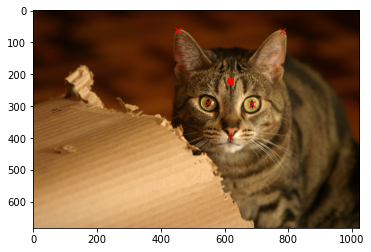

In [29]:
plt.imshow(image)
plt.plot(tmp[:,0],tmp[:,1],'rx')
plt.plot(center[0],center[1],'ro')

In [35]:
pts = []
for pt in tmp:
    vec = 1.2*(pt-center)
    print(vec+center)

[534.   303.64]
[700.8  309.64]
[618.   432.04]
[422.4       30.039993]
[814.8   33.64]


In [37]:
pts = 1.2*(tmp - center) + center

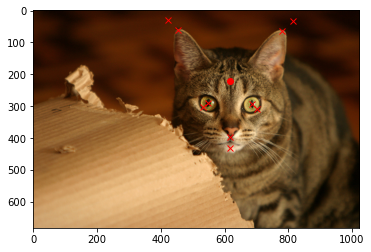

In [38]:
plt.imshow(image)
plt.plot(tmp[:,0],tmp[:,1],'rx')
plt.plot(pts[:,0],pts[:,1],'rx')
plt.plot(center[0],center[1],'ro')

In [39]:
left = np.min(tmp[:,0])
right = np.max(tmp[:,0])
top = np.min(tmp[:,1])
bottom = np.max(tmp[:,1])

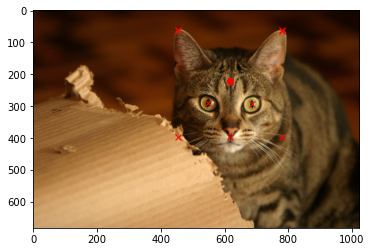

In [40]:
plt.imshow(image)
plt.plot(tmp[:,0],tmp[:,1],'rx')
plt.plot([left,left,right,right],[top,bottom,top,bottom],'rx')
plt.plot(center[0],center[1],'ro')

In [50]:
left = np.min(tmp[:,0])
right = np.max(tmp[:,0])
top = np.min(tmp[:,1])
bottom = np.max(tmp[:,1])
left = 1.2*(left-center[0])+center[0]
right = 1.2*(right-center[0])+center[0]
top = 1.2*(top-center[1])+center[1]
bottom = 1.5*(bottom - center[1])+center[1]

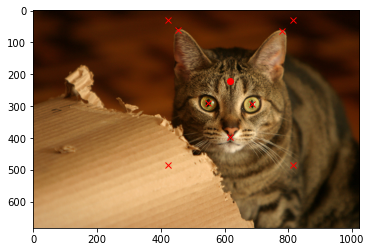

In [51]:
plt.imshow(image)
plt.plot(tmp[:,0],tmp[:,1],'rx')
plt.plot([left,left,right,right],[top,bottom,top,bottom],'rx')
plt.plot(center[0],center[1],'ro')

In [55]:
for file in glob.glob('training/*.jpg')[:10]:
    print(os.path.basename(file))

CAT_01_00000220_011.jpg
CAT_04_00001033_010.jpg
CAT_02_00000693_014.jpg
CAT_02_00000582_025.jpg
CAT_01_00000230_005.jpg
CAT_02_00000677_001.jpg
CAT_04_00001008_019.jpg
CAT_01_00000121_020.jpg
CAT_02_00000566_024.jpg
CAT_03_00000817_025.jpg


In [62]:
(image.size)[0]

1024

In [76]:
max(0,1,2)

2

In [79]:
def crop_pic(check=True):
    for file in glob.glob('training/*.jpg')[:10]:
        image = Image.open(file)
        name = os.path.basename(file)
        
        # extract the points for eye, ear and nose
        with open(file+'.cat') as fid:
            tmp = np.array([np.float32(x) for x in fid.readline().split()])
        if (tmp[0] != 5): continue
        tmp = np.array(tmp)[1:].reshape((5,2))
        left = np.min(tmp[:,0])
        right = np.max(tmp[:,0])
        top = np.min(tmp[:,1])
        bottom = np.max(tmp[:,1])
#         center = [0.5*(left+right),0.5*(top+bottom)]
        center = np.mean(tmp, axis=0)
        
        # extend a little for a box
        left = np.max((1.2*(left-center[0])+center[0], 0))
        right = np.min((1.2*(right-center[0])+center[0], (image.size)[0]))
        top = np.max((1.2*(top-center[1])+center[1], 0))
        bottom = np.min((1.5*(bottom - center[1])+center[1], (image.size)[1]))
        
        if check:
            plt.imshow(image)
            plt.plot([left,left,right,right],[top,bottom,top,bottom],'rx')
            plt.plot(tmp[:,0],tmp[:,1],'rx')
            plt.plot(center[0],center[1],'ro')
            plt.show()

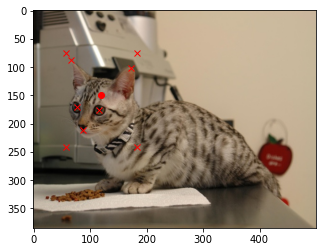

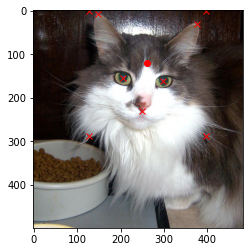

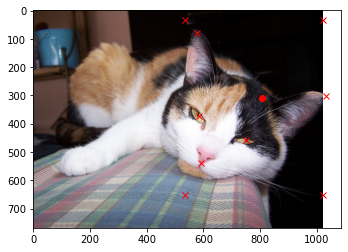

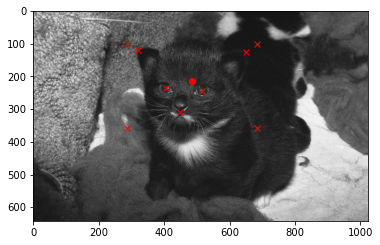

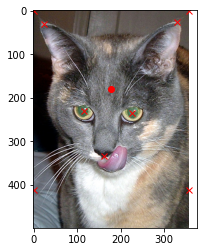

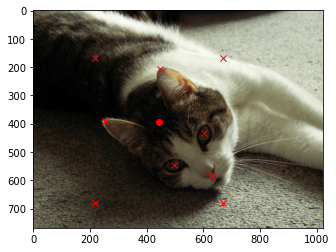

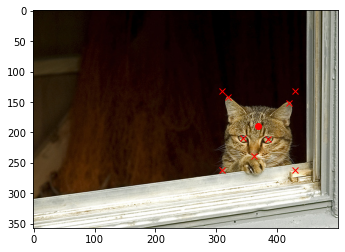

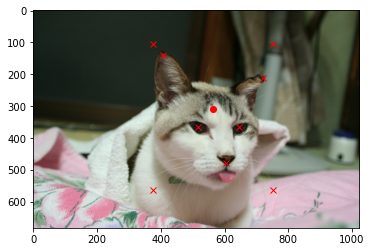

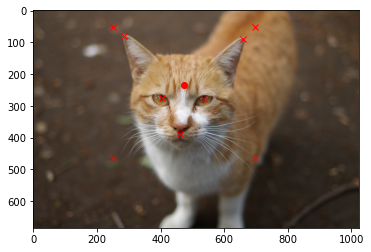

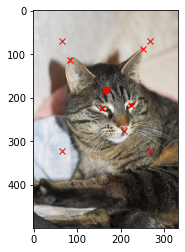

In [78]:
crop_pic()

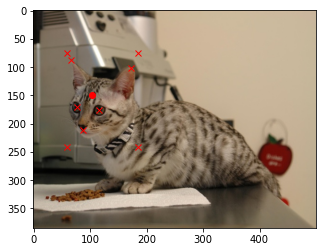

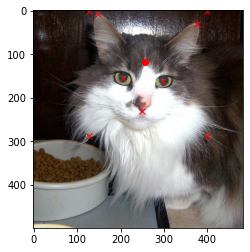

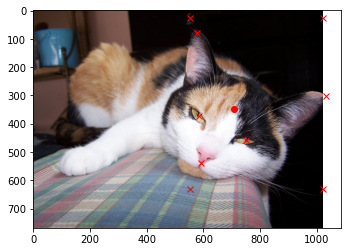

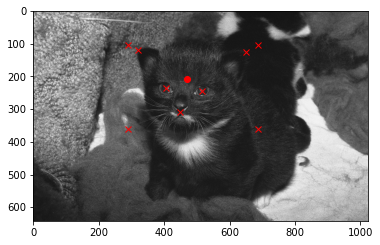

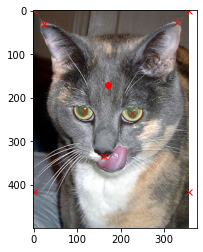

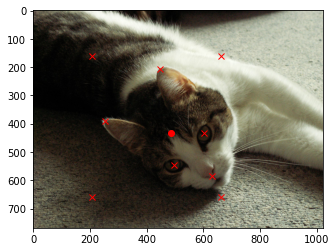

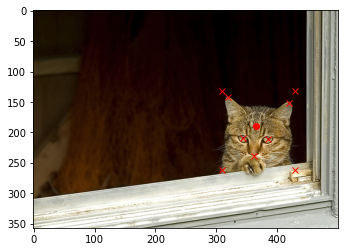

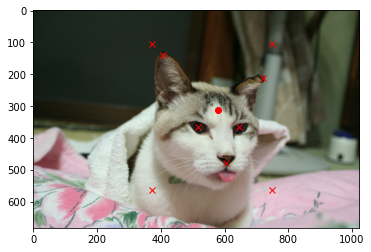

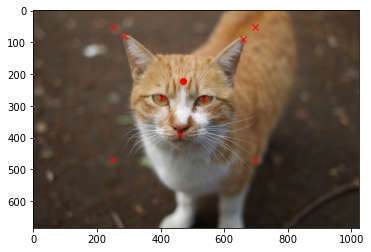

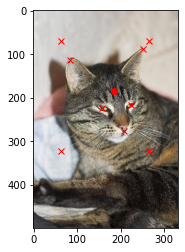

In [80]:
crop_pic()

In [87]:
def crop_pic(check=True,num=10):
    for file in glob.glob('training/*.jpg')[:num]:
        image = Image.open(file)
        name = os.path.basename(file)
        
        # extract the points for eye, ear and nose
        with open(file+'.cat') as fid:
            tmp = np.array([np.float32(x) for x in fid.readline().split()])
        if (tmp[0] != 5): continue
        tmp = np.array(tmp)[1:].reshape((5,2))
        center = np.mean(tmp, axis=0)
        
        # extend a little for a box; this is better than the previous version
        tmpsv = tmp.copy()
        tmp = 1.2*(tmp-center)+center
        left = np.max((np.min(tmp[:,0]), 0))
        right = np.min((np.max(tmp[:,0]), (image.size)[0]))
        top = np.max((np.min(tmp[:,1]), 0))
        bottom = np.max(tmp[:,1])
        bottom = np.min((1.2*(bottom - center[1])+center[1], (image.size)[1])) # extends more for the bottom
        
        if check:
            plt.imshow(image)
            plt.plot([left,left,right,right],[top,bottom,top,bottom],'rx')
            plt.plot(tmpsv[:,0],tmpsv[:,1],'rx')
            plt.plot(center[0],center[1],'ro')
            plt.show()

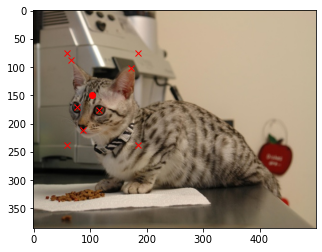

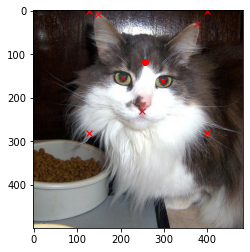

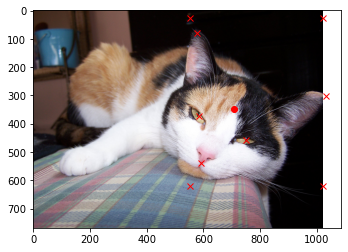

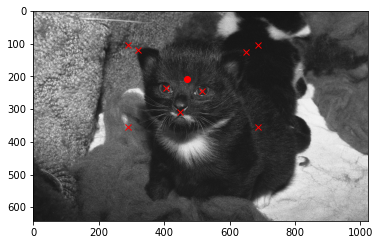

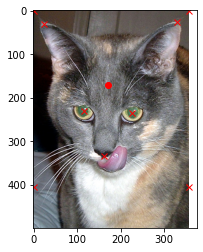

...

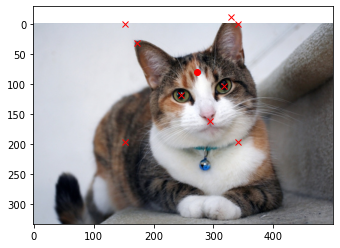

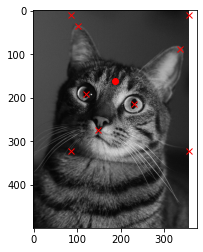

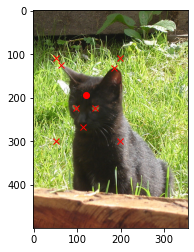

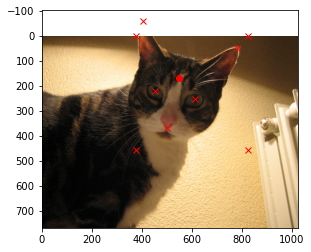

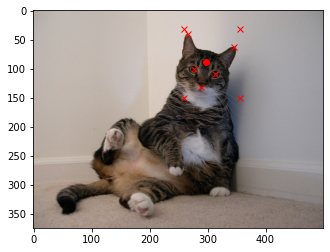

In [88]:
crop_pic(num=20)

In [92]:
tmp

array([[548., 290.],
       [687., 295.],
       [618., 397.],
       [455.,  62.],
       [782.,  65.]], dtype=float32)

In [91]:
np.argsort(tmp[:,1])

array([3, 4, 0, 1, 2])

In [110]:
def crop_pic(check=True,num=10):
    for file in glob.glob('training/*.jpg')[:num]:
        image = Image.open(file)
        name = os.path.basename(file)
        
        # extract the points for eye, ear and nose
        with open(file+'.cat') as fid:
            tmp = np.array([np.float32(x) for x in fid.readline().split()])
        if (tmp[0] != 5): continue
        tmp = np.array(tmp)[1:].reshape((5,2))
        idx = np.argsort(tmp[:,1])
        ear1, ear2, mouth = tmp[idx[0]], tmp[idx[1]], tmp[idx[4]]
        
        pts = []
        pts.append(1.2*(ear2-ear1) + ear1)
        pts.append(1.2*(ear1-ear2) + ear2)
        ear_center = 0.5*(ear1+ear2)
        pts.append(1.3*(mouth-ear_center) + ear_center)
        pts = np.array(pts)
        
        left = np.max((np.min(pts[:,0]), 0))
        right = np.min((np.max(pts[:,0]), (image.size)[0]))
        top = np.max((np.min(pts[:,1]), 0))
        bottom = np.min((np.max(pts[:,1]), (image.size)[1]))
        
        if check:
#             plt.imshow(image)
#             plt.plot([left,left,right,right],[top,bottom,top,bottom],'rx')
#             plt.plot(tmp[:,0],tmp[:,1],'rx')
#             plt.show()
            plt.imshow(image.crop((left,top,right,bottom)))
            plt.show()

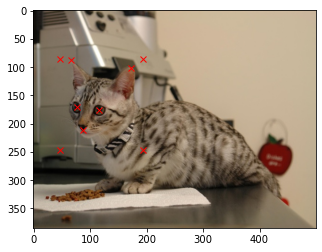

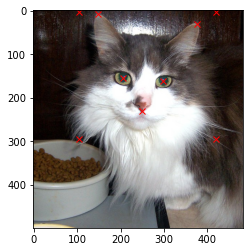

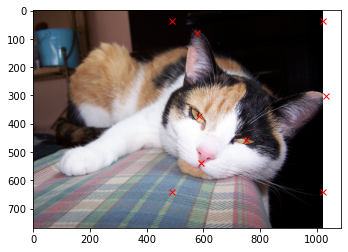

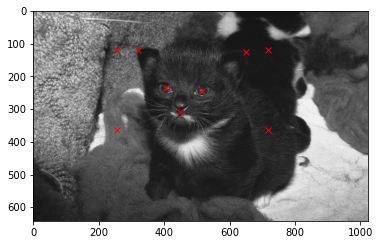

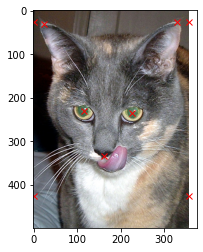

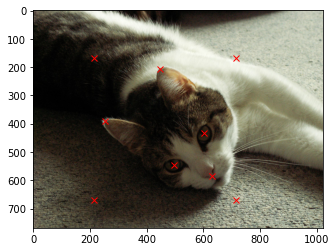

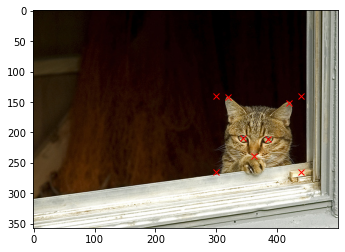

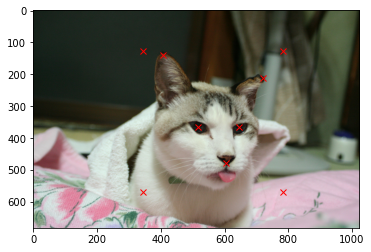

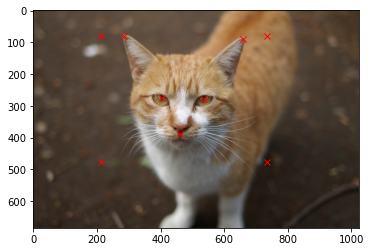

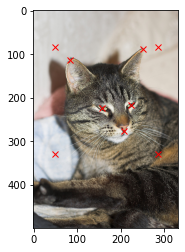

In [102]:
crop_pic()

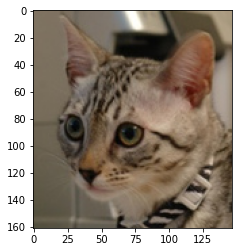

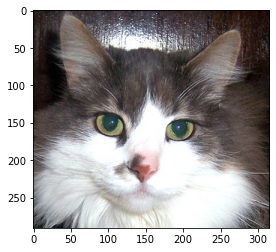

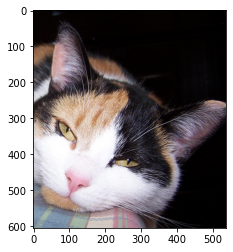

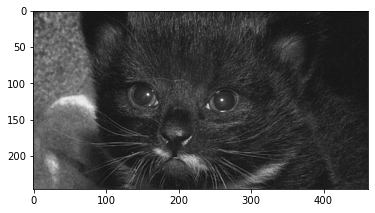

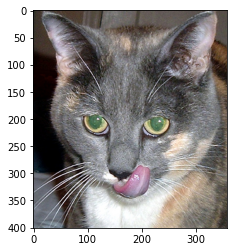

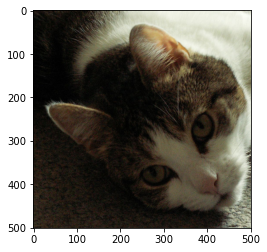

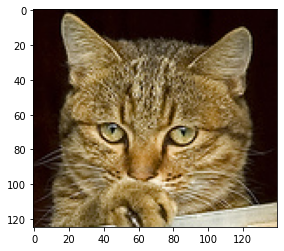

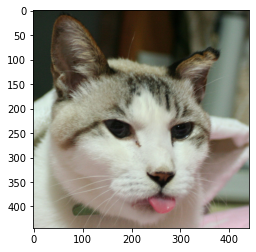

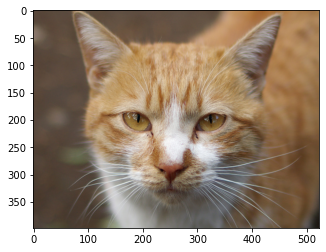

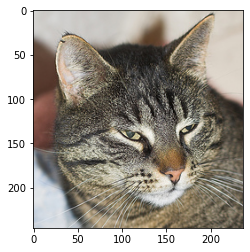

In [111]:
crop_pic()

In [ ]:
Image.c

In [120]:
def crop_pic(savedir='cropped/', workdir='training/*.jpg', check=True, num=10):
    for file in glob.glob(workdir)[:num]:
        image = Image.open(file)
        name = os.path.basename(file)
        
        # extract the points for eye, ear and nose
        with open(file+'.cat') as fid:
            tmp = np.array([np.float32(x) for x in fid.readline().split()])
        if (tmp[0] != 5): continue
        tmp = np.array(tmp)[1:].reshape((5,2))
        idx = np.argsort(tmp[:,1])
        ear1, ear2, mouth = tmp[idx[0]], tmp[idx[1]], tmp[idx[4]]
        
        pts = []
        pts.append(1.2*(ear2-ear1) + ear1)
        pts.append(1.2*(ear1-ear2) + ear2)
        ear_center = 0.5*(ear1+ear2)
        pts.append(1.3*(mouth-ear_center) + ear_center)
        pts = np.array(pts)
        
        left = np.max((np.min(pts[:,0]), 0))
        right = np.min((np.max(pts[:,0]), (image.size)[0]))
        top = np.max((np.min(pts[:,1]), 0))
        bottom = np.min((np.max(pts[:,1]), (image.size)[1]))
        image = image.crop((left,top,right,bottom))
        
        if check:
            plt.imshow(image)
            plt.show()
        
        image.save(os.path.join(savedir,name))

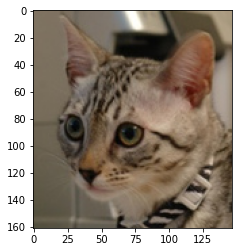

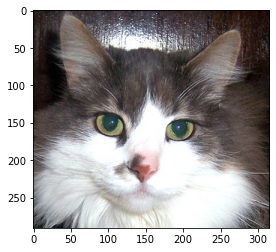

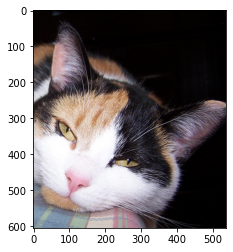

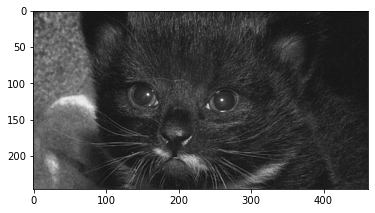

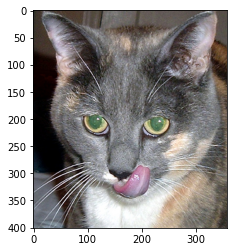

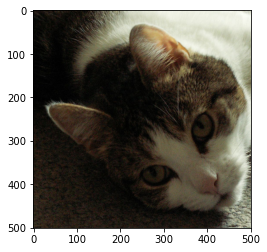

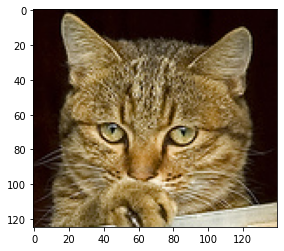

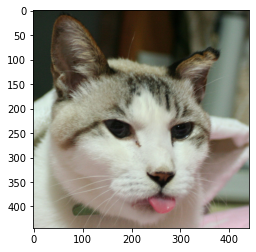

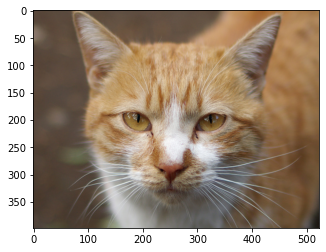

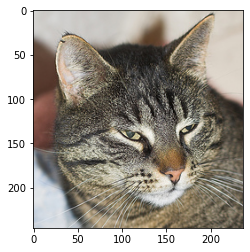

In [118]:
crop_pic(num=10)

In [119]:
crop_pic(check=False, num=-1)

In [121]:
crop_pic(check=False, workdir='test/*.jpg', num=-1)

In [122]:
crop_pic(check=False, workdir='validation/*.jpg', num=-1)

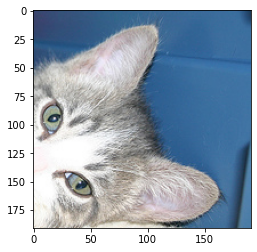

In [124]:
crop_pic(check=True, workdir='test/CAT_06_00001494_007.jpg', num=1)

In [128]:
def check_pic(savedir='cropped/', workdir='training/*.jpg', check=True, num=10):
    for file in glob.glob(workdir)[:num]:
        image = Image.open(file)
        name = os.path.basename(file)
        
        # extract the points for eye, ear and nose
        with open(file+'.cat') as fid:
            tmp = np.array([np.float32(x) for x in fid.readline().split()])
        if (tmp[0] != 5): continue
        tmp = np.array(tmp)[1:].reshape((5,2))
        idx = np.argsort(tmp[:,1])
        ear1, ear2, mouth = tmp[idx[0]], tmp[idx[1]], tmp[idx[4]]
        print(tmp)
        
        pts = []
        pts.append(1.2*(ear2-ear1) + ear1)
        pts.append(1.2*(ear1-ear2) + ear2)
        ear_center = 0.5*(ear1+ear2)
        pts.append(1.3*(mouth-ear_center) + ear_center)
        pts = np.array(pts)
        
        left = np.max((np.min(pts[:,0]), 0))
        right = np.min((np.max(pts[:,0]), (image.size)[0]))
        top = np.max((np.min(pts[:,1]), 0))
        bottom = np.min((np.max(pts[:,1]), (image.size)[1]))
        
        if check:
            plt.imshow(image)
            plt.plot([left,left,right,right],[top,bottom,top,bottom],'rx')
            plt.plot(tmp[:,0],tmp[:,1],'rx')
            plt.show()

[[327. 171.]
 [350. 231.]
 [287. 215.]
 [416.  93.]
 [471. 237.]]


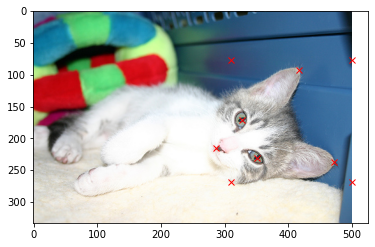

In [130]:
check_pic(check=True, workdir='test/CAT_06_00001494_007.jpg', num=1)

[[169. 140.]
 [281. 148.]
 [248. 242.]
 [104. -63.]
 [341. -50.]]


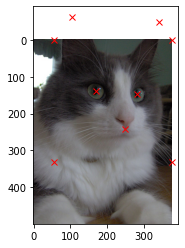

[[ 45.  91.]
 [ 89.  81.]
 [ 74. 117.]
 [  0.  38.]
 [ 98.   9.]]


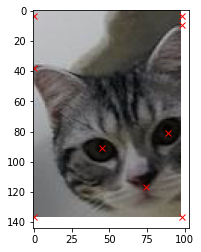

[[20. 61.]
 [52. 64.]
 [31. 89.]
 [ 1.  0.]
 [85. 16.]]


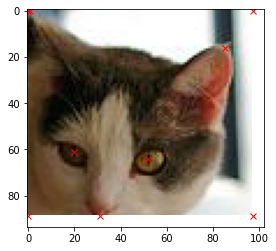

[[ 97. 172.]
 [161. 163.]
 [142. 223.]
 [ 24.  84.]
 [193.  49.]]


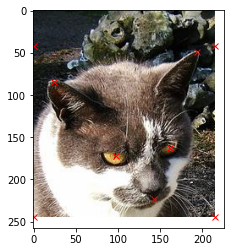

[[ 72.  92.]
 [125.  90.]
 [102. 132.]
 [ 20.  17.]
 [163.   9.]]


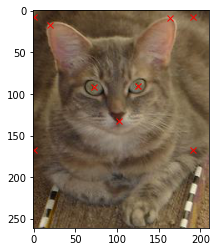

[[139. 128.]
 [174. 134.]
 [160. 157.]
 [118.  70.]
 [199.  85.]]


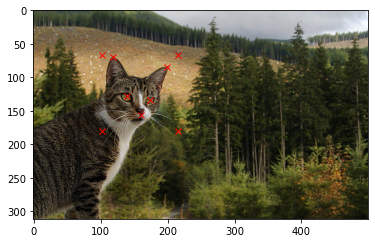

[[34. 66.]
 [78. 59.]
 [59. 75.]
 [ 0. 17.]
 [95.  0.]]


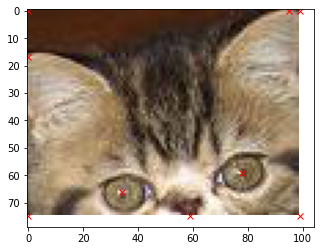

[[239. 331.]
 [321. 214.]
 [349. 337.]
 [ 66. 281.]
 [237.   0.]]


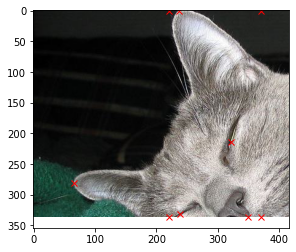

[[154. 132.]
 [236. 146.]
 [182. 205.]
 [123.   7.]
 [307.  41.]]


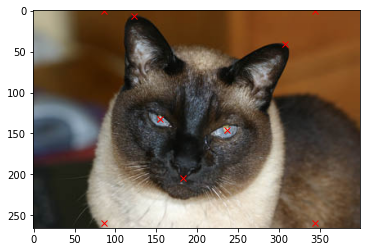

[[ 71. 104.]
 [134. 104.]
 [102. 161.]
 [ 19.   1.]
 [182.   2.]]


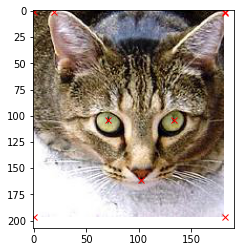

In [131]:
check_pic(check=True, workdir='test/CAT*.jpg', num=10)

In [136]:
def crop_pic(savedir='cropped/', workdir='training/*.jpg', check=True, num=10):
    for file in glob.glob(workdir)[:num]:
        image = Image.open(file)
        name = os.path.basename(file)
        
        # extract the points for eye, ear and nose
        with open(file+'.cat') as fid:
            tmp = np.array([np.float32(x) for x in fid.readline().split()])
        if (tmp[0] != 5): continue
        tmp = np.array(tmp)[1:].reshape((5,2))
        
        # looks like this will work
        mouth, ear1, ear2 = tmp[2], tmp[3], tmp[4]
        
        pts = []
        pts.append(1.2*(ear2-ear1) + ear1)
        pts.append(1.2*(ear1-ear2) + ear2)
        ear_center = 0.5*(ear1+ear2)
        pts.append(1.3*(mouth-ear_center) + ear_center)
        pts = np.array(pts)
        
        left = np.max((np.min(pts[:,0]), 0))
        right = np.min((np.max(pts[:,0]), (image.size)[0]))
        top = np.max((np.min(pts[:,1]), 0))
        bottom = np.min((np.max(pts[:,1]), (image.size)[1]))
        image = image.crop((left,top,right,bottom))
        
        if check:
            plt.imshow(image)
            plt.show()
        
        image.save(os.path.join(savedir,name))

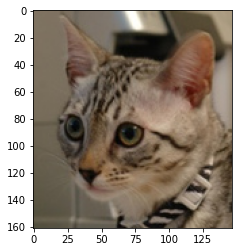

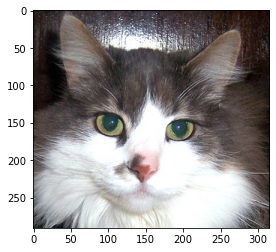

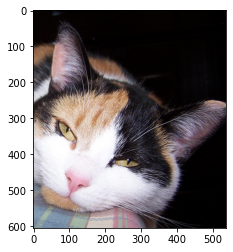

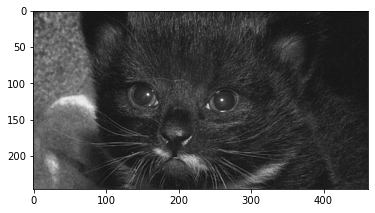

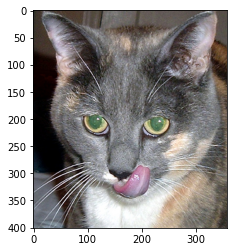

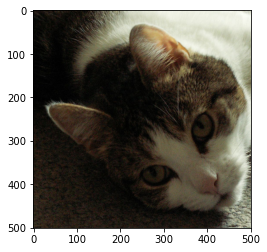

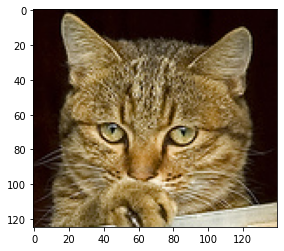

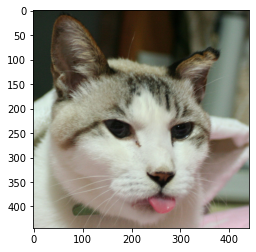

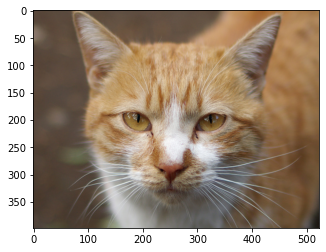

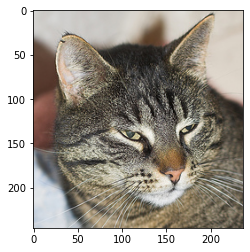

In [137]:
crop_pic()

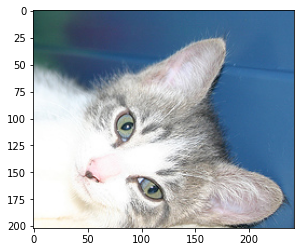

In [138]:
crop_pic(check=True, workdir='test/CAT_06_00001494_007.jpg', num=1)

In [140]:
crop_pic(check=False, num=-1)

In [141]:
crop_pic(check=False, workdir='test/*.jpg',num=-1)

In [142]:
crop_pic(check=False, workdir='validation/*.jpg',num=-1)